In [1]:
from PIL import Image
import zipfile
import os

In [2]:
from surya.ocr import run_ocr
from surya.model.detection.segformer import load_model as load_det_model, load_processor as load_det_processor
from surya.model.recognition.model import load_model as load_rec_model
from surya.model.recognition.processor import load_processor as load_rec_processor

/Users/rafael/anaconda3/envs/ocr/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/rafael/anaconda3/envs/ocr/lib/python3.11/site-packages/transformers/utils/generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
/Users/rafael/anaconda3/envs/ocr/lib/python3.11/site-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [3]:
langs = ["es"] # Choose language accordingly
det_processor, det_model = load_det_processor(), load_det_model()
rec_model, rec_processor = load_rec_model(), load_rec_processor()

Loading detection model vikp/surya_det on device cpu with dtype torch.float32
Loading recognition model vikp/surya_rec on device mps with dtype torch.float16


In [ ]:
doc_path = 'receipts.zip' # Path to the zip file containing the receipts

In [56]:
zip_ref  = zipfile.ZipFile(doc_path, 'r')

In [57]:
all_images = []
for file_name in zip_ref.namelist():
  _, file_extension = os.path.splitext(file_name)
  if file_extension == ".png" or file_extension == ".jpeg":
      file = zip_ref.open(file_name)
      image = Image.open(file)
      all_images.append(image)


In [60]:
all_predictions = []
for image in all_images:
  predictions = run_ocr([image], [langs],  det_model, det_processor, rec_model, rec_processor)
  all_predictions.append(predictions)

Recognizing Text: 100%|██████████| 1/1 [09:40<00:00, 580.21s/it]


In [15]:
from PIL import ImageDraw
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec



def display_boxes(image, predictions):
    """Draws the bounding boxes around the text in the image."""
    img = image.copy()
    draw = ImageDraw.Draw(img)
    for box in predictions:
        draw.rectangle(box, outline='red', width=3)
    
    fig = plt.figure(figsize=(20, 10))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])
    fig.subplots_adjust(wspace=-1)

    ax1 = plt.subplot(gs[0])
    ax1.imshow(image)
    ax1.set_title('Original Image')
    ax1.axis('off')

    ax2 = plt.subplot(gs[1])
    ax2.imshow(img)
    ax2.set_title('Image with Boxes')
    ax2.axis('off')

    plt.tight_layout(pad=-2)
    plt.show()

In [19]:
predictions[0].keys()

dict_keys(['text_lines', 'polys', 'bboxes', 'language'])

In [20]:
predictions[0]['text_lines']

['a',
 '(9 LG ',
 '29WN600 – W',
 '29WN600',
 'MODEL NO./MODELO : ',
 '29WN600 – WN.AWPEDSN',
 'PRODUCT CODE/\nCODIGO DE PRODUCTO P',
 '2.0 A',
 '19 V                                                                                                                                                           ',
 'POVVER/ALIMENTACIÓN : ',
 '010NTWG2W009',
 'SERIAL NO./',
 'numero de serie   13',
 'HECHO EN CHINA',
 '',
 '10 / 2020',
 ' MANUFACTURED\n FECHA DE FABRICACION']

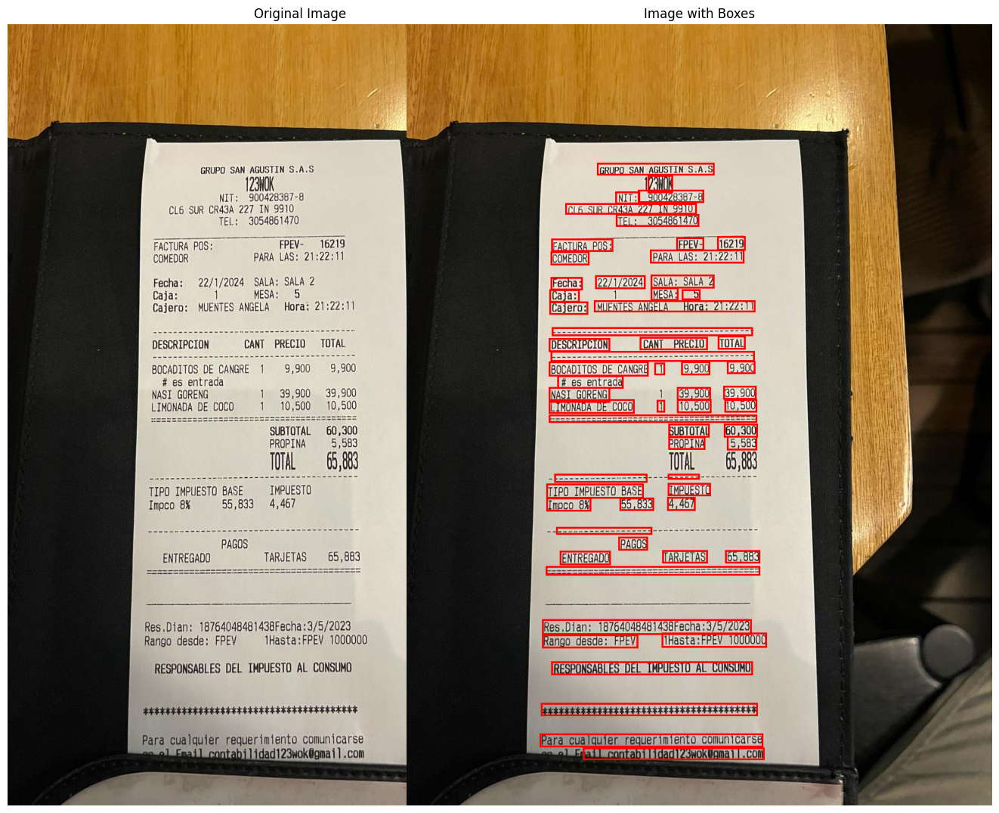

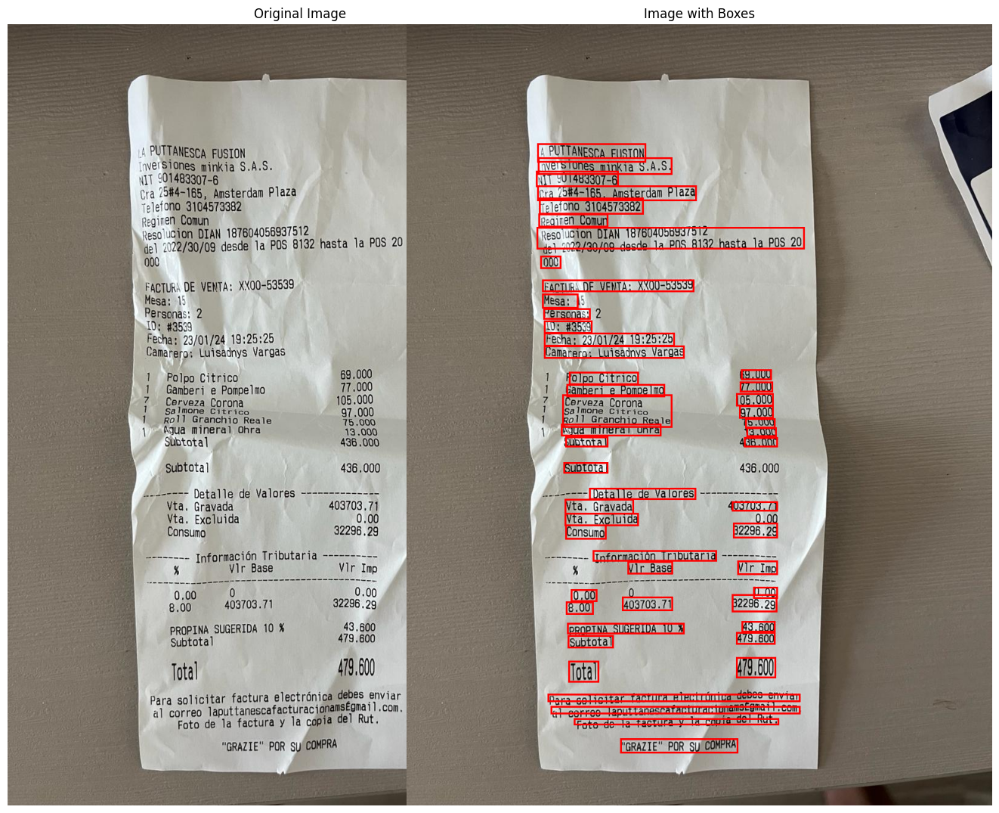

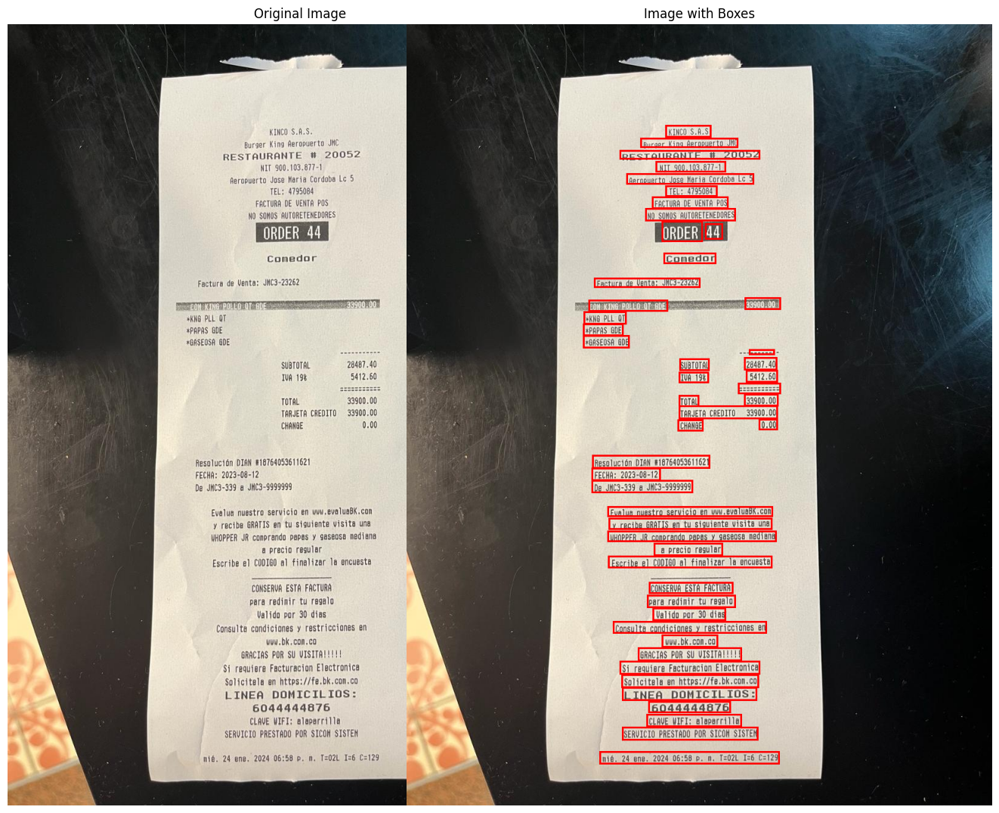

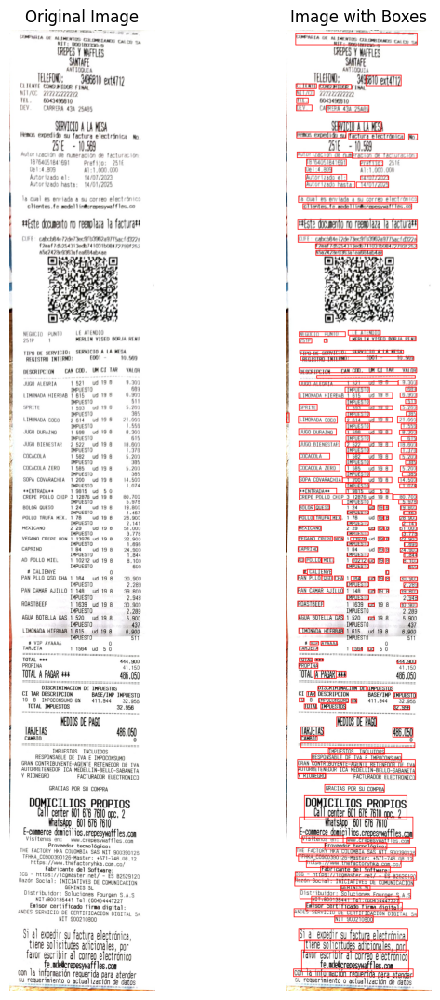

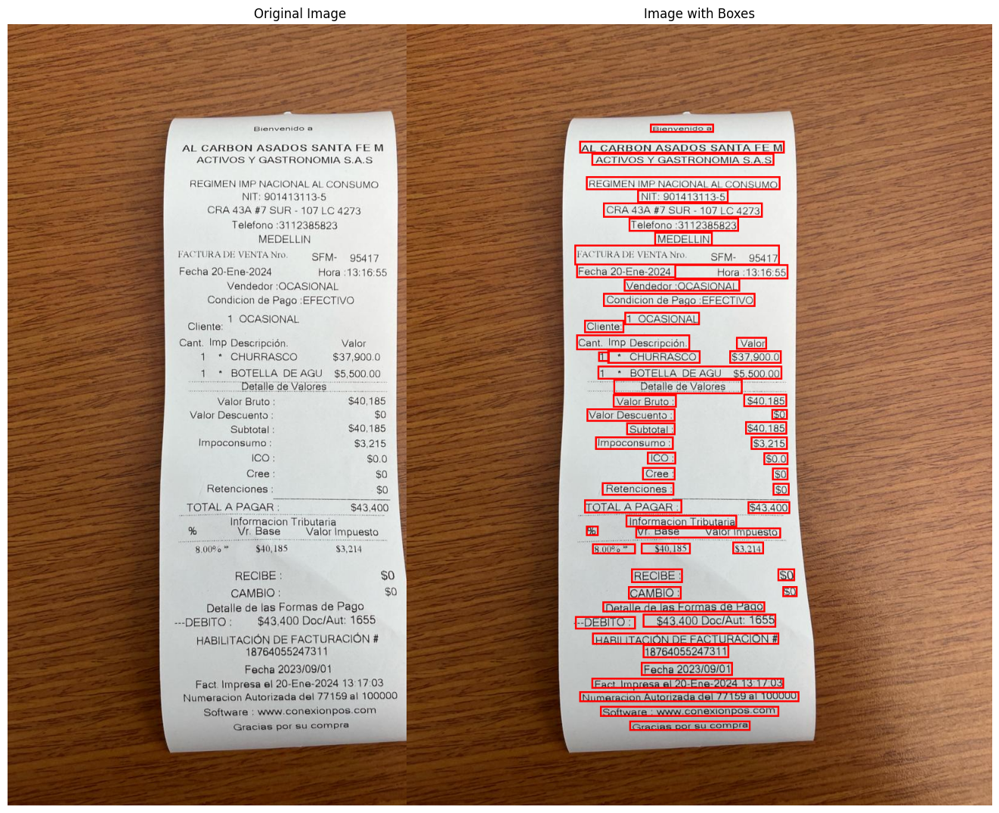

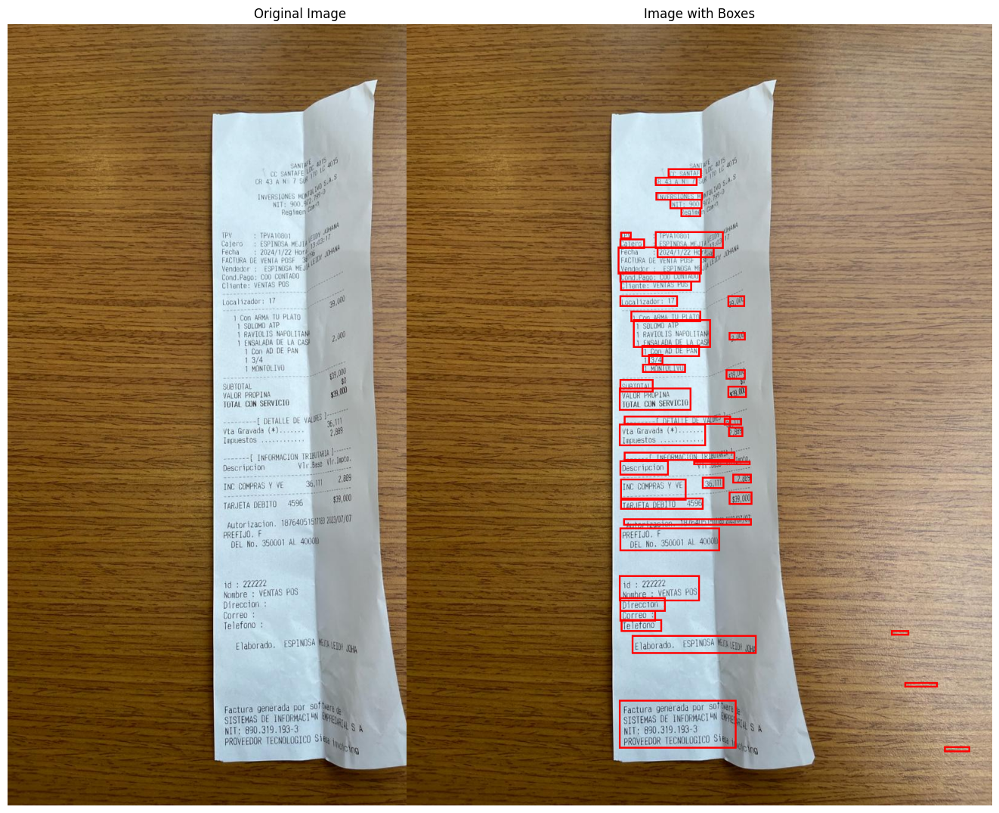

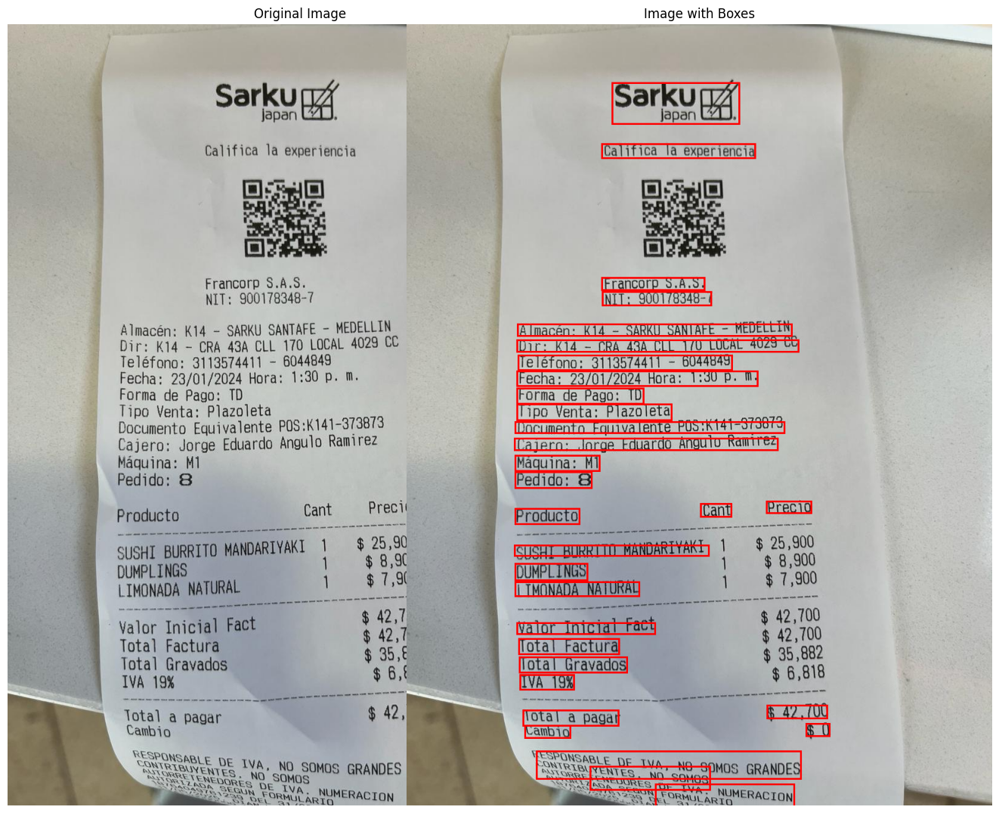

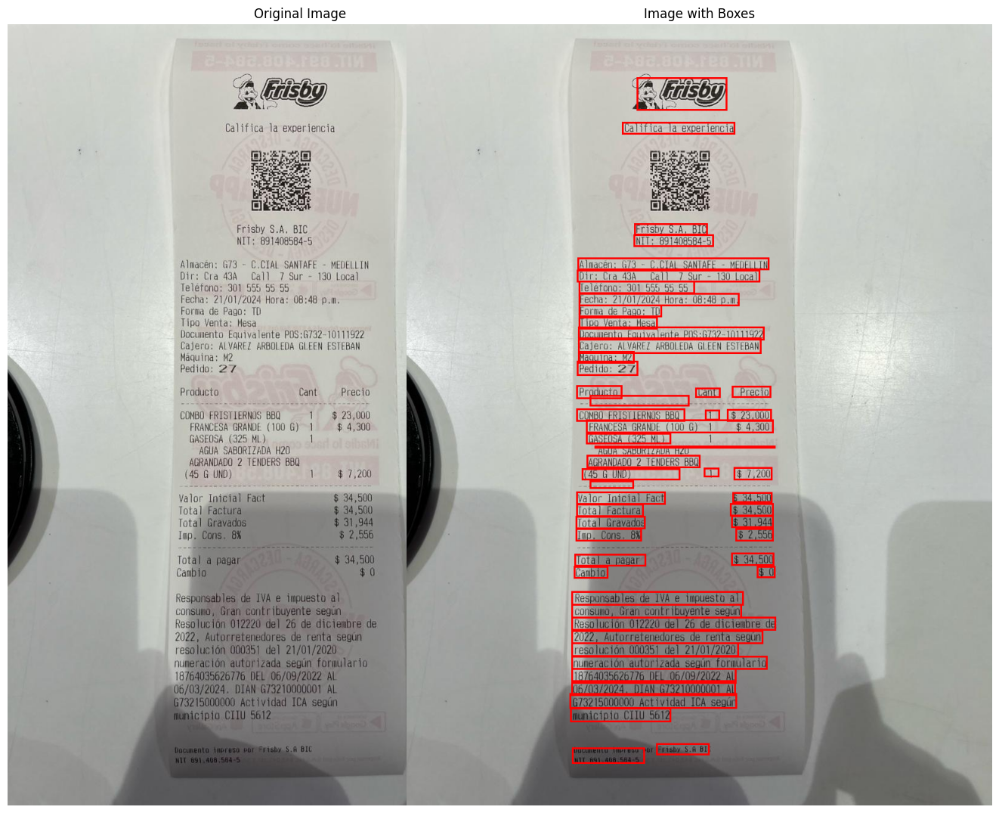

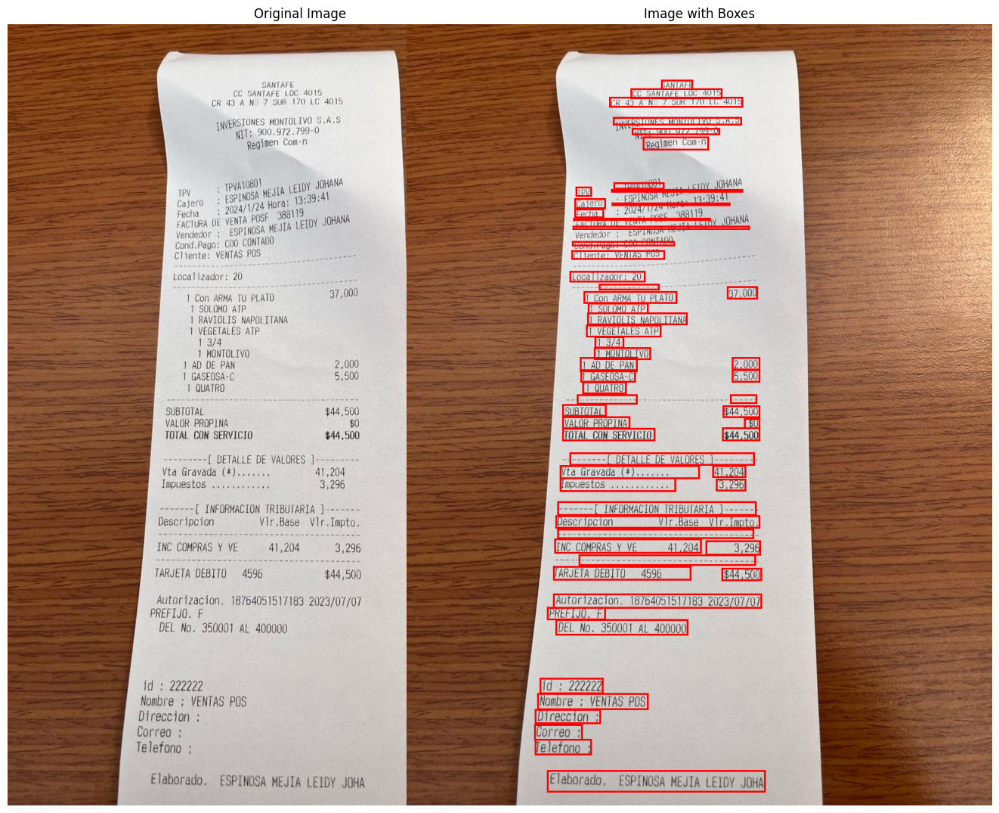

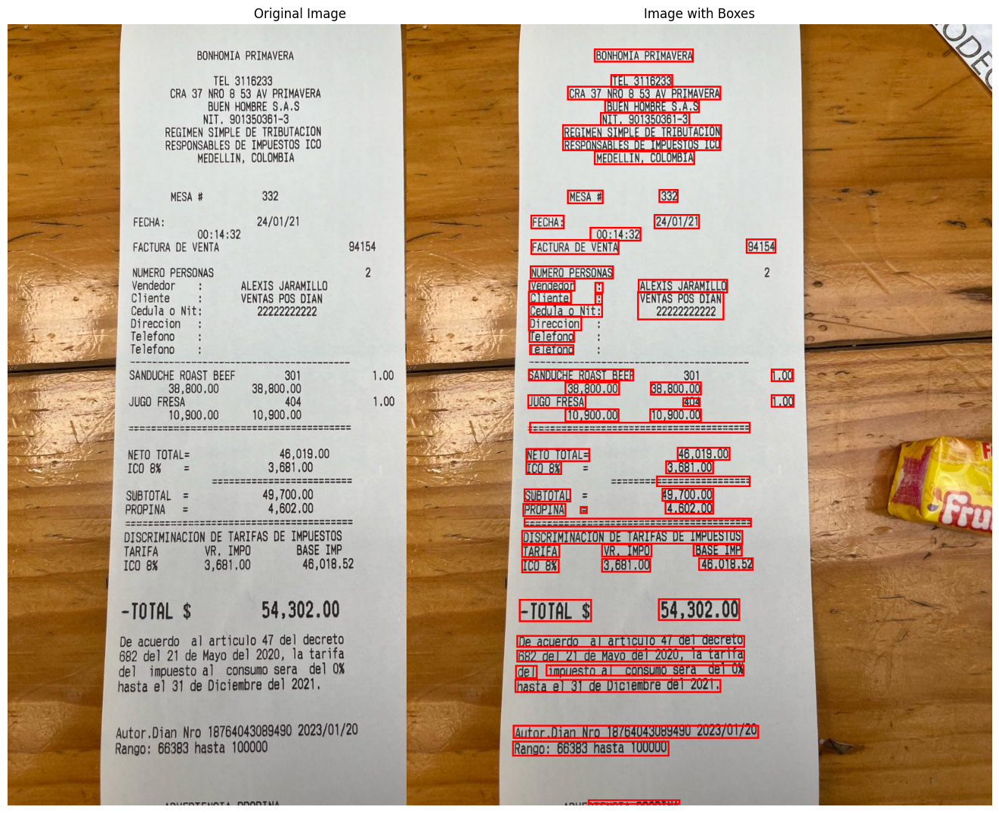

In [68]:
for i in range(len(all_images)):
    display_boxes(all_images[i], all_predictions[i][0]['bboxes'])